In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

/usr/local/Cellar/python/3.7.5/Frameworks/Python.framework/Versions/3.7/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
/usr/local/Cellar/python/3.7.5/Frameworks/Python.framework/Versions/3.7/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
/usr/local/Cellar/python/3.7.5/Frameworks/Python.framework/Versions/3.7/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
/usr/local/Cellar/python/3.7.5/Frameworks/Python.framework/Versions/3.7/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibili

In [9]:
df = pd.read_csv('../datasets/KNN_Project_Data')

In [10]:
df.head()

,XVPM,GWYH,TRAT,TLLZ,IGGA,HYKR,EDFS,GUUB,MGJM,JHZC,TARGET CLASS
0,1636.670614,817.988525,2565.995189,358.347163,550.417491,1618.870897,2147.641254,330.727893,1494.878631,845.136088,0
1,1013.402760,577.587332,2644.141273,280.428203,1161.873391,2084.107872,853.404981,447.157619,1193.032521,861.081809,1
2,1300.035501,820.518697,2025.854469,525.562292,922.206261,2552.355407,818.676686,845.491492,1968.367513,1647.186291,1
3,1059.347542,1066.866418,612.000041,480.827789,419.467495,685.666983,852.867810,341.664784,1154.391368,1450.935357,0
4,1018.340526,1313.679056,950.622661,724.742174,843.065903,1370.554164,905.469453,658.118202,539.459350,1899.850792,0


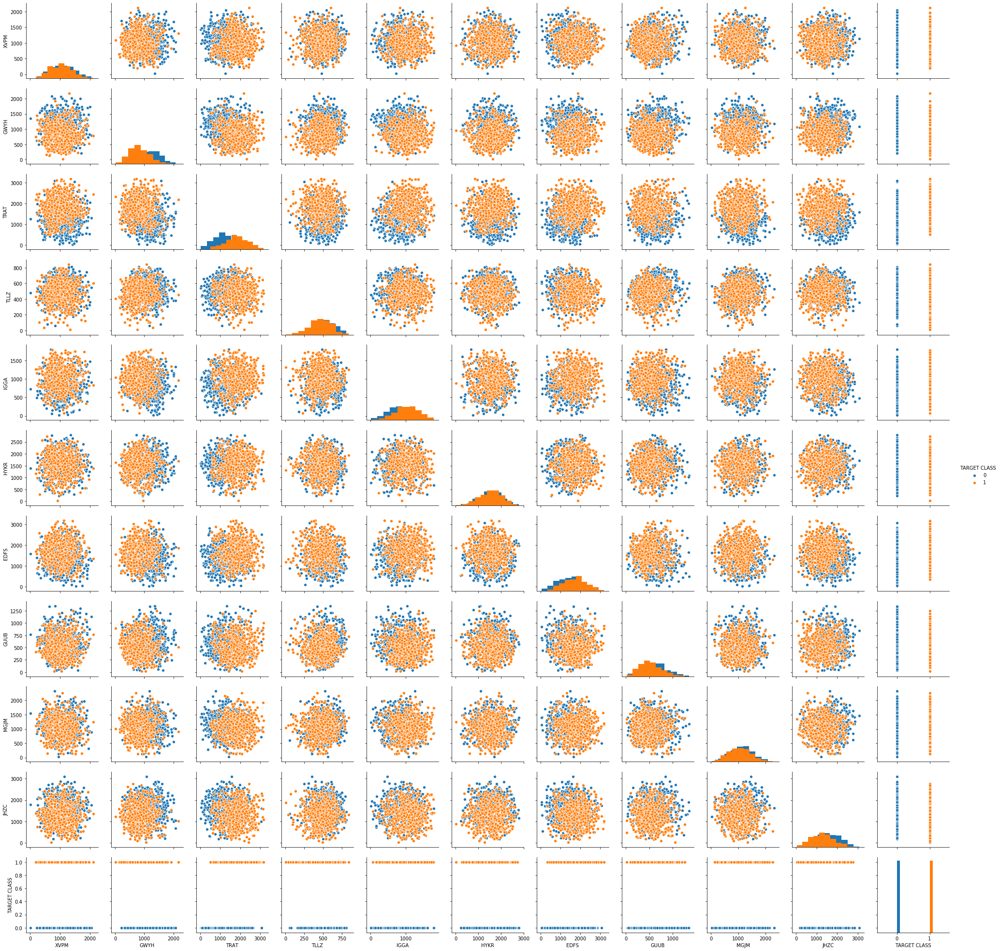

In [11]:
sns.pairplot(df,hue='TARGET CLASS',diag_kind='hist')

### Standardize the variable

In [12]:
from sklearn.preprocessing import StandardScaler

/usr/local/Cellar/python/3.7.5/Frameworks/Python.framework/Versions/3.7/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)


In [13]:
scaler = StandardScaler()

In [19]:
scaler.fit(df.drop('TARGET CLASS', axis = 1))

StandardScaler(copy=True, with_mean=True, with_std=True)

In [20]:
scaled_feat = scaler.transform(df.drop('TARGET CLASS',axis = 1))

In [22]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(scaled_feat, df['TARGET CLASS'], test_size=0.33, random_state=101)

In [23]:
from sklearn.neighbors import KNeighborsClassifier

In [24]:
knn = KNeighborsClassifier(n_neighbors=1)

In [25]:
knn.fit(X_train,y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=1, p=2,
                     weights='uniform')

In [26]:
prediction = knn.predict(X_test)

In [28]:
from sklearn.metrics import classification_report,confusion_matrix

In [43]:
print('****  K = 1  ****\n')
print('\n\n**  CONFUSION MATRIX  **\n')
print(confusion_matrix(y_test,prediction))
print('\n\n**  CLASSIFICATION REPORT  **\n')
print(classification_report(y_test,prediction))

****  K = 1  ****



**  CONFUSION MATRIX  **

[[115  47]
 [ 48 120]]


**  CLASSIFICATION REPORT  **

              precision    recall  f1-score   support

           0       0.71      0.71      0.71       162
           1       0.72      0.71      0.72       168

    accuracy                           0.71       330
   macro avg       0.71      0.71      0.71       330
weighted avg       0.71      0.71      0.71       330



### Choosing best K value using Elbow method

In [31]:
error_report = []

for i in range(1,50):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train,y_train)
    pred_i = knn.predict(X_test)
    error_report.append(np.mean(pred_i != y_test))

Text(0, 0.5, 'Error Rate')

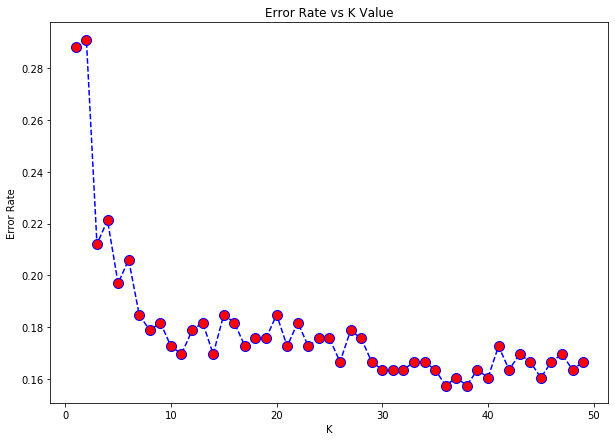

In [33]:
plt.figure(figsize=(10,7))
plt.plot(range(1,50),error_report,color='blue',marker='o',linestyle='dashed',markerfacecolor='red',markersize=10)
plt.title('Error Rate vs K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

### Prediction and Evaluation

In [34]:
knn = KNeighborsClassifier(n_neighbors=26)
knn.fit(X_train,y_train)
pred = knn.predict(X_test)

In [38]:
print('\n\n**  K = 26  **')
print('\n\n**  CONFUSION MATRIX  **\n')
print(confusion_matrix(y_test,pred))
print('\n\n**  CLASSIFICATION REPORT  **\n')
print(classification_report(y_test,pred))



**  K = 26  **


**  CONFUSION MATRIX  **

[[134  28]
 [ 27 141]]


**  CLASSIFICATION REPORT  **

              precision    recall  f1-score   support

           0       0.83      0.83      0.83       162
           1       0.83      0.84      0.84       168

    accuracy                           0.83       330
   macro avg       0.83      0.83      0.83       330
weighted avg       0.83      0.83      0.83       330

